In [0]:
from pyspark.sql.types import *
from pyspark.sql.functions import * 
from pyspark.sql.window import Window
from pyspark.sql import SparkSession 

#create session
spark = SparkSession.builder.appName("IPL Data Analysis").getOrCreate()

In [0]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.3.2 
 Master 
 local[8] 
 AppName 
 Databricks Shell

### Data Reading & Formating

####ball_by_ball_df

In [0]:
ball_by_ball_df = spark.read.option('inferschema','true').format("csv").option("header","true").load("s3://ipl-data-analysis-project/Ball_By_Ball.csv")

In [0]:
ball_by_ball_df.limit(5).display()

MatcH_id,Over_id,Ball_id,Innings_No,Team_Batting,Team_Bowling,Striker_Batting_Position,Extra_Type,Runs_Scored,Extra_runs,Wides,Legbyes,Byes,Noballs,Penalty,Bowler_Extras,Out_type,Caught,Bowled,Run_out,LBW,Retired_hurt,Stumped,caught_and_bowled,hit_wicket,ObstructingFeild,Bowler_Wicket,Match_Date,Season,Striker,Non_Striker,Bowler,Player_Out,Fielders,Striker_match_SK,StrikerSK,NonStriker_match_SK,NONStriker_SK,Fielder_match_SK,Fielder_SK,Bowler_match_SK,BOWLER_SK,PlayerOut_match_SK,BattingTeam_SK,BowlingTeam_SK,Keeper_Catch,Player_out_sk,MatchDateSK
598028,15,6,1,5,2,6,No Extras,4,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,2013-04-20,2013,277,104,83,null,null,20336,276,20333,103,-1,-1,20343,82,-1,4,1,0,0,20130420
598028,14,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,2013-04-20,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,14,2,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,2013-04-20,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,14,3,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,2013-04-20,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,0,0,20130420
598028,14,4,1,5,2,3,No Extras,0,0,0,0,0,0,0,0,Not Applicable,0,0,0,0,0,0,0,0,0,0,2013-04-20,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,0,0,20130420


In [0]:
ball_by_ball_df.printSchema()

root
 |-- MatcH_id: integer (nullable = true)
 |-- Over_id: integer (nullable = true)
 |-- Ball_id: integer (nullable = true)
 |-- Innings_No: integer (nullable = true)
 |-- Team_Batting: string (nullable = true)
 |-- Team_Bowling: string (nullable = true)
 |-- Striker_Batting_Position: integer (nullable = true)
 |-- Extra_Type: string (nullable = true)
 |-- Runs_Scored: integer (nullable = true)
 |-- Extra_runs: integer (nullable = true)
 |-- Wides: integer (nullable = true)
 |-- Legbyes: integer (nullable = true)
 |-- Byes: integer (nullable = true)
 |-- Noballs: integer (nullable = true)
 |-- Penalty: integer (nullable = true)
 |-- Bowler_Extras: integer (nullable = true)
 |-- Out_type: string (nullable = true)
 |-- Caught: integer (nullable = true)
 |-- Bowled: integer (nullable = true)
 |-- Run_out: integer (nullable = true)
 |-- LBW: integer (nullable = true)
 |-- Retired_hurt: integer (nullable = true)
 |-- Stumped: integer (nullable = true)
 |-- caught_and_bowled: integer (null

In [0]:
bool_columns = ["Caught", "Bowled", "Run_out", "LBW", "Retired_hurt", "Stumped",
                "caught_and_bowled", "hit_wicket", "ObstructingFeild", "Bowler_Wicket", "Keeper_Catch"]

In [0]:
for column in bool_columns:
    ball_by_ball_df = ball_by_ball_df.withColumn(
        column, when(col(column) == 1, True).when(col(column) == 0, False).otherwise(None)
    )

ball_by_ball_df = ball_by_ball_df.withColumn(
    "MatchDateSK",
    to_date(col("MatchDateSK").cast("string"), "yyyyMMdd")
)

In [0]:
ball_by_ball_df.printSchema()


root
 |-- MatcH_id: integer (nullable = true)
 |-- Over_id: integer (nullable = true)
 |-- Ball_id: integer (nullable = true)
 |-- Innings_No: integer (nullable = true)
 |-- Team_Batting: string (nullable = true)
 |-- Team_Bowling: string (nullable = true)
 |-- Striker_Batting_Position: integer (nullable = true)
 |-- Extra_Type: string (nullable = true)
 |-- Runs_Scored: integer (nullable = true)
 |-- Extra_runs: integer (nullable = true)
 |-- Wides: integer (nullable = true)
 |-- Legbyes: integer (nullable = true)
 |-- Byes: integer (nullable = true)
 |-- Noballs: integer (nullable = true)
 |-- Penalty: integer (nullable = true)
 |-- Bowler_Extras: integer (nullable = true)
 |-- Out_type: string (nullable = true)
 |-- Caught: boolean (nullable = true)
 |-- Bowled: boolean (nullable = true)
 |-- Run_out: boolean (nullable = true)
 |-- LBW: boolean (nullable = true)
 |-- Retired_hurt: boolean (nullable = true)
 |-- Stumped: boolean (nullable = true)
 |-- caught_and_bowled: boolean (null

In [0]:
ball_by_ball_df.display()

MatcH_id,Over_id,Ball_id,Innings_No,Team_Batting,Team_Bowling,Striker_Batting_Position,Extra_Type,Runs_Scored,Extra_runs,Wides,Legbyes,Byes,Noballs,Penalty,Bowler_Extras,Out_type,Caught,Bowled,Run_out,LBW,Retired_hurt,Stumped,caught_and_bowled,hit_wicket,ObstructingFeild,Bowler_Wicket,Match_Date,Season,Striker,Non_Striker,Bowler,Player_Out,Fielders,Striker_match_SK,StrikerSK,NonStriker_match_SK,NONStriker_SK,Fielder_match_SK,Fielder_SK,Bowler_match_SK,BOWLER_SK,PlayerOut_match_SK,BattingTeam_SK,BowlingTeam_SK,Keeper_Catch,Player_out_sk,MatchDateSK
598028,15,6,1,5,2,6,No Extras,4,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,277,104,83,null,null,20336,276,20333,103,-1,-1,20343,82,-1,4,1,false,0,2013-04-20
598028,14,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,false,0,2013-04-20
598028,14,2,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,false,0,2013-04-20
598028,14,3,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,104,6,346,null,null,20333,103,20328,5,-1,-1,20348,345,-1,4,1,false,0,2013-04-20
598028,14,4,1,5,2,3,No Extras,0,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,false,0,2013-04-20
598028,14,5,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,false,0,2013-04-20
598028,14,6,1,5,2,3,No Extras,2,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,6,104,346,null,null,20328,5,20333,103,-1,-1,20348,345,-1,4,1,false,0,2013-04-20
598028,13,1,1,5,2,5,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,104,6,83,null,null,20333,103,20328,5,-1,-1,20343,82,-1,4,1,false,0,2013-04-20
598028,13,2,1,5,2,3,No Extras,4,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,false,0,2013-04-20
598028,13,3,1,5,2,3,No Extras,1,0,0,0,0,0,0,0,Not Applicable,false,false,false,false,false,false,false,false,false,false,2013-04-20,2013,6,104,83,null,null,20328,5,20333,103,-1,-1,20343,82,-1,4,1,false,0,2013-04-20


In [0]:
match_df = spark.read.option('inferschema',True).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Match.csv")

####match_df

In [0]:
match_df.printSchema()

root
 |-- Match_SK: integer (nullable = true)
 |-- match_id: integer (nullable = true)
 |-- Team1: string (nullable = true)
 |-- Team2: string (nullable = true)
 |-- match_date: date (nullable = true)
 |-- Season_Year: integer (nullable = true)
 |-- Venue_Name: string (nullable = true)
 |-- City_Name: string (nullable = true)
 |-- Country_Name: string (nullable = true)
 |-- Toss_Winner: string (nullable = true)
 |-- match_winner: string (nullable = true)
 |-- Toss_Name: string (nullable = true)
 |-- Win_Type: string (nullable = true)
 |-- Outcome_Type: string (nullable = true)
 |-- ManOfMach: string (nullable = true)
 |-- Win_Margin: string (nullable = true)
 |-- Country_id: integer (nullable = true)



####player_df

In [0]:
player_df = spark.read.option("inferschema",True).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Player.csv")


#### player_match_df

In [0]:
player_match_df = spark.read.option('inferschema',True).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Player_match.csv")

In [0]:
player_match_df.limit(5).display()

Player_match_SK,PlayerMatch_key,Match_Id,Player_Id,Player_Name,DOB,Batting_hand,Bowling_skill,Country_Name,Role_Desc,Player_team,Opposit_Team,Season_year,is_manofThematch,Age_As_on_match,IsPlayers_Team_won,Batting_Status,Bowling_Status,Player_Captain,Opposit_captain,Player_keeper,Opposit_keeper
-1,-1.0,-1,-1,N/A,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
12694,3.3598700006E10,335987,6,R Dravid,1973-01-11,Right-hand bat,Right-arm offbreak,India,Captain,Royal Challengers Bangalore,Kolkata Knight Riders,2008,0,35,0,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12695,3.3598700007E10,335987,7,W Jaffer,1978-02-16,Right-hand bat,Right-arm offbreak,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,0,30,0,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12696,3.3598700008E10,335987,8,V Kohli,1988-11-05,Right-hand bat,Right-arm medium,India,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,0,20,0,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha
12697,3.3598700009E10,335987,9,JH Kallis,1975-10-16,Right-hand bat,Right-arm fast-medium,South Africa,Player,Royal Challengers Bangalore,Kolkata Knight Riders,2008,0,33,0,null,null,R Dravid,SC Ganguly,MV Boucher,WP Saha


In [0]:
player_match_df=\
player_match_df.withColumn(
        'is_manofthematch',
            when(col('is_manofthematch')==0, False)
            .when(col('is_manofthematch')==1, True)
            .otherwise(None)).withColumn(
                'isplayers_team_won',
                when(col('isplayers_team_won')==0,False).
                when(col('isplayers_team_won')==1,True).
                otherwise(None))

#### team_df

In [0]:
team_df = spark.read.option('inferschema',True).format("csv").option("header","true").load("s3://ipl-data-analysis-project/Team.csv")
     

In [0]:
team_df.display()

Team_SK,Team_Id,Team_Name
0,1,Kolkata Knight Riders
1,2,Royal Challengers Bangalore
2,3,Chennai Super Kings
3,4,Kings XI Punjab
4,5,Rajasthan Royals
5,6,Delhi Daredevils
6,7,Mumbai Indians
7,8,Deccan Chargers
8,9,Kochi Tuskers Kerala
9,10,Pune Warriors


### DATA_ANALYSIS

In [0]:
# Filter to include only valid deliveries (excluding extras like wides and no balls for specific analyses)
ball_by_ball_df = ball_by_ball_df.filter((col("wides") == 0) & (col("noballs")==0))

# Aggregation: Calculate the total and average runs scored in each match and inning
total_and_avg_runs = ball_by_ball_df.groupBy("match_id", "innings_no").agg(
    sum("runs_scored").alias("total_runs"),
    avg("runs_scored").alias("average_runs")
)

In [0]:
# Window Function: Calculate running total of runs in each match for each over
windowSpec = Window.partitionBy("match_id","innings_no").orderBy("over_id")

ball_by_ball_df = ball_by_ball_df.withColumn(
    "running_total_runs",
    sum("runs_scored").over(windowSpec)
)

In [0]:
# Conditional Column: Flag for high impact balls (either a wicket or more than 6 runs including extras)
ball_by_ball_df = ball_by_ball_df.withColumn(
    "high_impact",
    when((col("runs_scored") + col("extra_runs") > 6) | (col("bowler_wicket") == True), True).otherwise(False)
)

In [0]:
ball_by_ball_df.show(5)

+--------+-------+-------+----------+------------+------------+------------------------+----------+-----------+----------+-----+-------+----+-------+-------+-------------+--------------+------+------+-------+-----+------------+-------+-----------------+----------+----------------+-------------+----------+------+-------+-----------+------+----------+--------+----------------+---------+-------------------+-------------+----------------+----------+---------------+---------+------------------+--------------+--------------+------------+-------------+-----------+------------------+-----------+
|MatcH_id|Over_id|Ball_id|Innings_No|Team_Batting|Team_Bowling|Striker_Batting_Position|Extra_Type|Runs_Scored|Extra_runs|Wides|Legbyes|Byes|Noballs|Penalty|Bowler_Extras|      Out_type|Caught|Bowled|Run_out|  LBW|Retired_hurt|Stumped|caught_and_bowled|hit_wicket|ObstructingFeild|Bowler_Wicket|Match_Date|Season|Striker|Non_Striker|Bowler|Player_Out|Fielders|Striker_match_SK|StrikerSK|NonStriker_match_S

In [0]:

# Extracting year, month, and day from the match date for more detailed time-based analysis
match_df = match_df.withColumn("year", year("match_date"))
match_df = match_df.withColumn("month", month("match_date"))
match_df = match_df.withColumn("day", dayofmonth("match_date"))

# High margin win: categorizing win margins into 'high', 'medium', and 'low'
match_df = match_df.withColumn(
    "win_margin_category",
    when(col("win_margin") >= 100, "High")
    .when((col("win_margin") >= 50) & (col("win_margin") < 100), "Medium")
    .otherwise("Low")
)

# Analyze the impact of the toss: who wins the toss and the match
match_df = match_df.withColumn(
    "toss_match_winner",
    when(col("toss_winner") == col("match_winner"), "Yes").otherwise("No")
)

# Show the enhanced match DataFrame
match_df.display()

Match_SK,match_id,Team1,Team2,match_date,Season_Year,Venue_Name,City_Name,Country_Name,Toss_Winner,match_winner,Toss_Name,Win_Type,Outcome_Type,ManOfMach,Win_Margin,Country_id,year,month,day,win_margin_category,toss_match_winner
0,335987,Royal Challengers Bangalore,Kolkata Knight Riders,2008-04-18,2008,M Chinnaswamy Stadium,Bangalore,India,Royal Challengers Bangalore,Kolkata Knight Riders,field,runs,Result,BB McCullum,140,1,2008,4,18,High,No
1,335988,Kings XI Punjab,Chennai Super Kings,2008-04-19,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Chennai Super Kings,Chennai Super Kings,bat,runs,Result,MEK Hussey,33,1,2008,4,19,Low,Yes
2,335989,Delhi Daredevils,Rajasthan Royals,2008-04-19,2008,Feroz Shah Kotla,Delhi,India,Rajasthan Royals,Delhi Daredevils,bat,wickets,Result,MF Maharoof,9,1,2008,4,19,Low,No
3,335990,Mumbai Indians,Royal Challengers Bangalore,2008-04-20,2008,Wankhede Stadium,Mumbai,India,Mumbai Indians,Royal Challengers Bangalore,bat,wickets,Result,MV Boucher,5,1,2008,4,20,Low,No
4,335991,Kolkata Knight Riders,Deccan Chargers,2008-04-20,2008,Eden Gardens,Kolkata,India,Deccan Chargers,Kolkata Knight Riders,bat,wickets,Result,DJ Hussey,5,1,2008,4,20,Low,No
5,335992,Rajasthan Royals,Kings XI Punjab,2008-04-21,2008,Sawai Mansingh Stadium,Jaipur,India,Kings XI Punjab,Rajasthan Royals,bat,wickets,Result,SR Watson,6,1,2008,4,21,Low,No
6,335993,Deccan Chargers,Delhi Daredevils,2008-04-22,2008,"Rajiv Gandhi International Stadium, Uppal",Hyderabad,India,Deccan Chargers,Delhi Daredevils,bat,wickets,Result,V Sehwag,9,1,2008,4,22,Low,No
7,335994,Chennai Super Kings,Mumbai Indians,2008-04-23,2008,"MA Chidambaram Stadium, Chepauk",Chennai,India,Mumbai Indians,Chennai Super Kings,field,runs,Result,ML Hayden,6,1,2008,4,23,Low,No
8,335995,Deccan Chargers,Rajasthan Royals,2008-04-24,2008,"Rajiv Gandhi International Stadium, Uppal",Hyderabad,India,Rajasthan Royals,Rajasthan Royals,field,wickets,Result,YK Pathan,3,1,2008,4,24,Low,Yes
9,335996,Kings XI Punjab,Mumbai Indians,2008-04-25,2008,"Punjab Cricket Association Stadium, Mohali",Chandigarh,India,Mumbai Indians,Kings XI Punjab,field,runs,Result,KC Sangakkara,66,1,2008,4,25,Medium,No


In [0]:
# Normalize and clean player names
player_df = player_df.withColumn("player_name", lower(regexp_replace("player_name", "[^a-zA-Z0-9 ]", "")))

# Handle missing values in 'batting_hand' and 'bowling_skill' with a default 'unknown'
player_df = player_df.na.fill({"batting_hand": "unknown", "bowling_skill": "unknown"})

# Categorizing players based on batting hand
player_df = player_df.withColumn(
    "batting_style",
    when(col("batting_hand").contains("left"), "Left-Handed").otherwise("Right-Handed")
)

# Show the modified player DataFrame
player_df.show(2)

+---------+---------+-----------+----------+--------------+----------------+------------+-------------+
|PLAYER_SK|Player_Id|player_name|       DOB|  Batting_hand|   Bowling_skill|Country_Name|batting_style|
+---------+---------+-----------+----------+--------------+----------------+------------+-------------+
|        0|        1| sc ganguly|1972-07-08| Left-hand bat|Right-arm medium|       India| Right-Handed|
|        1|        2|bb mccullum|1981-09-27|Right-hand bat|Right-arm medium| New Zealand| Right-Handed|
+---------+---------+-----------+----------+--------------+----------------+------------+-------------+
only showing top 2 rows



In [0]:
# Add a 'veteran_status' column based on player age
player_match_df = player_match_df.withColumn(
    "veteran_status",
    when(col("age_as_on_match") >= 35, "Veteran").otherwise("Non-Veteran")
)

# Dynamic column to calculate years since debut
player_match_df = player_match_df.withColumn(
    "years_since_debut",
    (year(current_date()) - col("season_year"))
)

# Show the enriched DataFrame
player_match_df.show()

+---------------+---------------+--------+---------+---------------+----------+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+--------------+--------------+---------------+-------------+--------------+--------------+-----------------+
|Player_match_SK|PlayerMatch_key|Match_Id|Player_Id|    Player_Name|       DOB|  Batting_hand|       Bowling_skill|Country_Name|Role_Desc|         Player_team|        Opposit_Team|Season_year|is_manofthematch|Age_As_on_match|isplayers_team_won|Batting_Status|Bowling_Status|Player_Captain|Opposit_captain|Player_keeper|Opposit_keeper|veteran_status|years_since_debut|
+---------------+---------------+--------+---------+---------------+----------+--------------+--------------------+------------+---------+--------------------+--------------------+-----------+----------------+---------------+------------------+--------------+-----

In [0]:
ball_by_ball_df.createOrReplaceTempView("ball_by_ball")
match_df.createOrReplaceTempView("match")
player_df.createOrReplaceTempView("player")
player_match_df.createOrReplaceTempView("player_match")
team_df.createOrReplaceTempView("team")

In [0]:
ball_by_ball_df.columns

Out[58]: ['MatcH_id',
 'Over_id',
 'Ball_id',
 'Innings_No',
 'Team_Batting',
 'Team_Bowling',
 'Striker_Batting_Position',
 'Extra_Type',
 'Runs_Scored',
 'Extra_runs',
 'Wides',
 'Legbyes',
 'Byes',
 'Noballs',
 'Penalty',
 'Bowler_Extras',
 'Out_type',
 'Caught',
 'Bowled',
 'Run_out',
 'LBW',
 'Retired_hurt',
 'Stumped',
 'caught_and_bowled',
 'hit_wicket',
 'ObstructingFeild',
 'Bowler_Wicket',
 'Match_Date',
 'Season',
 'Striker',
 'Non_Striker',
 'Bowler',
 'Player_Out',
 'Fielders',
 'Striker_match_SK',
 'StrikerSK',
 'NonStriker_match_SK',
 'NONStriker_SK',
 'Fielder_match_SK',
 'Fielder_SK',
 'Bowler_match_SK',
 'BOWLER_SK',
 'PlayerOut_match_SK',
 'BattingTeam_SK',
 'BowlingTeam_SK',
 'Keeper_Catch',
 'Player_out_sk',
 'MatchDateSK',
 'running_total_runs',
 'high_impact']

In [0]:
top_scoring_batsmen_per_season = spark.sql("""
SELECT 
p.player_name,
m.season_year,
SUM(b.runs_scored) AS total_runs 
FROM ball_by_ball b
JOIN match m ON b.match_id = m.match_id   
JOIN player_match pm ON m.match_id = pm.match_id AND b.striker = pm.player_id     
JOIN player p ON p.player_id = pm.player_id
GROUP BY p.player_name, m.season_year
ORDER BY m.season_year, total_runs DESC
""")

In [0]:
economical_bowlers_powerplay = spark.sql("""
SELECT 
p.player_name, 
AVG(b.runs_scored) AS avg_runs_per_ball, 
COUNT(b.bowler_wicket) AS total_wickets
FROM ball_by_ball b
JOIN player_match pm ON b.match_id = pm.match_id AND b.bowler = pm.player_id
JOIN player p ON pm.player_id = p.player_id
WHERE b.over_id <= 6
GROUP BY p.player_name
HAVING COUNT(*) >= 1
ORDER BY avg_runs_per_ball, total_wickets DESC
""")
economical_bowlers_powerplay.show()

     

+---------------+------------------+-------------+
|    player_name| avg_runs_per_ball|total_wickets|
+---------------+------------------+-------------+
|     sm harwood|0.3333333333333333|           18|
|     avesh khan|               0.5|           12|
|     ankit soni|               0.5|            6|
|      gr napier|               0.5|            6|
|       aj finch|               0.5|            6|
|        a zampa|               0.5|            6|
|       nb singh|0.5833333333333334|           24|
|     ag murtaza|0.6538461538461539|           78|
|      sb bangar|0.6666666666666666|           18|
|     d du preez|0.6666666666666666|           18|
|        s gopal|0.6666666666666666|            6|
|     fh edwards|0.6923076923076923|           78|
|       a kumble|0.7685185185185185|          108|
|       umar gul|0.7777777777777778|           36|
|j syed mohammad|0.7777777777777778|           18|
|   kp pietersen|0.7777777777777778|           18|
|    rj peterson|0.833333333333

In [0]:
toss_impact_individual_matches = spark.sql("""
SELECT m.match_id, m.toss_winner, m.toss_name, m.match_winner,
       CASE WHEN m.toss_winner = m.match_winner THEN 'Won' ELSE 'Lost' END AS match_outcome
FROM match m
WHERE m.toss_name IS NOT NULL
ORDER BY m.match_id
""")
toss_impact_individual_matches.show()

+--------+--------------------+---------+--------------------+-------------+
|match_id|         toss_winner|toss_name|        match_winner|match_outcome|
+--------+--------------------+---------+--------------------+-------------+
|  335987|Royal Challengers...|    field|Kolkata Knight Ri...|         Lost|
|  335988| Chennai Super Kings|      bat| Chennai Super Kings|          Won|
|  335989|    Rajasthan Royals|      bat|    Delhi Daredevils|         Lost|
|  335990|      Mumbai Indians|      bat|Royal Challengers...|         Lost|
|  335991|     Deccan Chargers|      bat|Kolkata Knight Ri...|         Lost|
|  335992|     Kings XI Punjab|      bat|    Rajasthan Royals|         Lost|
|  335993|     Deccan Chargers|      bat|    Delhi Daredevils|         Lost|
|  335994|      Mumbai Indians|    field| Chennai Super Kings|         Lost|
|  335995|    Rajasthan Royals|    field|    Rajasthan Royals|          Won|
|  335996|      Mumbai Indians|    field|     Kings XI Punjab|         Lost|

In [0]:
average_runs_in_wins = spark.sql("""
SELECT p.player_name, AVG(b.runs_scored) AS avg_runs_in_wins, COUNT(*) AS innings_played
FROM ball_by_ball b
JOIN player_match pm ON b.match_id = pm.match_id AND b.striker = pm.player_id
JOIN player p ON pm.player_id = p.player_id
JOIN match m ON pm.match_id = m.match_id
WHERE m.match_winner = pm.player_team
GROUP BY p.player_name
ORDER BY avg_runs_in_wins ASC
""")
average_runs_in_wins.show()

     

+--------------+-------------------+--------------+
|   player_name|   avg_runs_in_wins|innings_played|
+--------------+-------------------+--------------+
|       a nehra|                0.0|             2|
|    kp appanna|                0.0|             1|
|     jj bumrah|                0.0|             2|
|      i sharma|                0.0|             1|
|      ts mills|                0.0|             3|
|      j theron|                0.0|             1|
|      vr aaron|                0.0|             5|
|     sn thakur|                0.0|             2|
| anirudh singh|                0.0|             1|
|    t thushara|                0.2|             5|
|     sa abbott|               0.25|             4|
| yashpal singh| 0.3157894736842105|            19|
|   s sreesanth| 0.3333333333333333|             3|
|   kc cariappa| 0.3333333333333333|             3|
|    jd unadkat|                0.4|             5|
|    sm harwood|0.42857142857142855|             7|
|      r shu

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

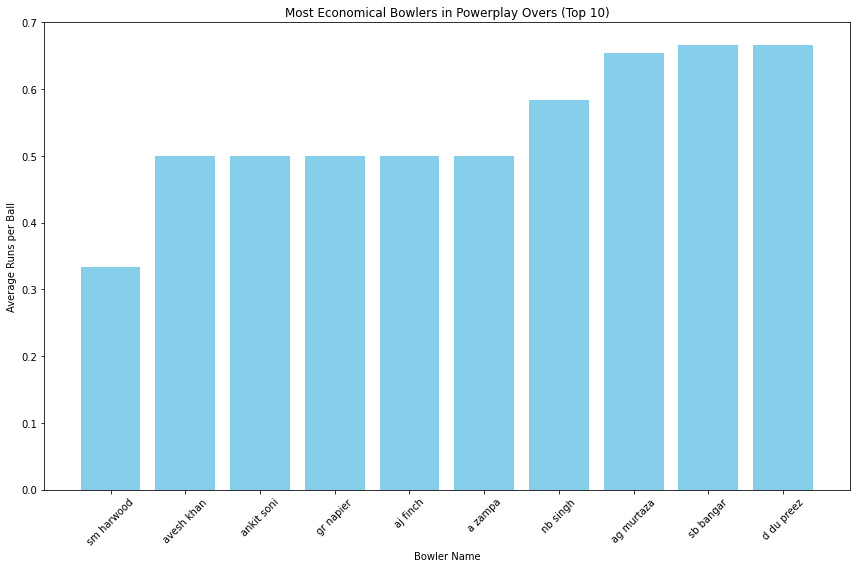

In [0]:
# Assuming 'economical_bowlers_powerplay' is already executed and available as a Spark DataFrame
economical_bowlers_pd = economical_bowlers_powerplay.toPandas()

# Visualizing using Matplotlib
plt.figure(figsize=(12, 8))
# Limiting to top 10 for clarity in the plot
top_economical_bowlers = economical_bowlers_pd.nsmallest(10, 'avg_runs_per_ball')
plt.bar(top_economical_bowlers['player_name'], top_economical_bowlers['avg_runs_per_ball'], color='skyblue')
plt.xlabel('Bowler Name')
plt.ylabel('Average Runs per Ball')
plt.title('Most Economical Bowlers in Powerplay Overs (Top 10)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

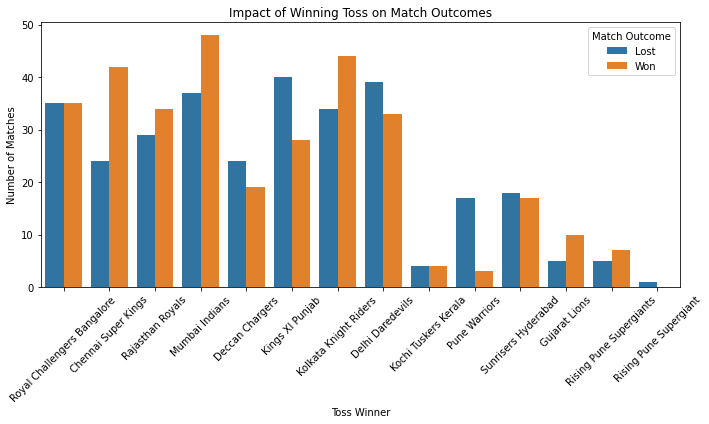

In [0]:
toss_impact_pd = toss_impact_individual_matches.toPandas()

# Creating a countplot to show win/loss after winning toss
plt.figure(figsize=(10, 6))
sns.countplot(x='toss_winner', hue='match_outcome', data=toss_impact_pd)
plt.title('Impact of Winning Toss on Match Outcomes')
plt.xlabel('Toss Winner')
plt.ylabel('Number of Matches')
plt.legend(title='Match Outcome')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

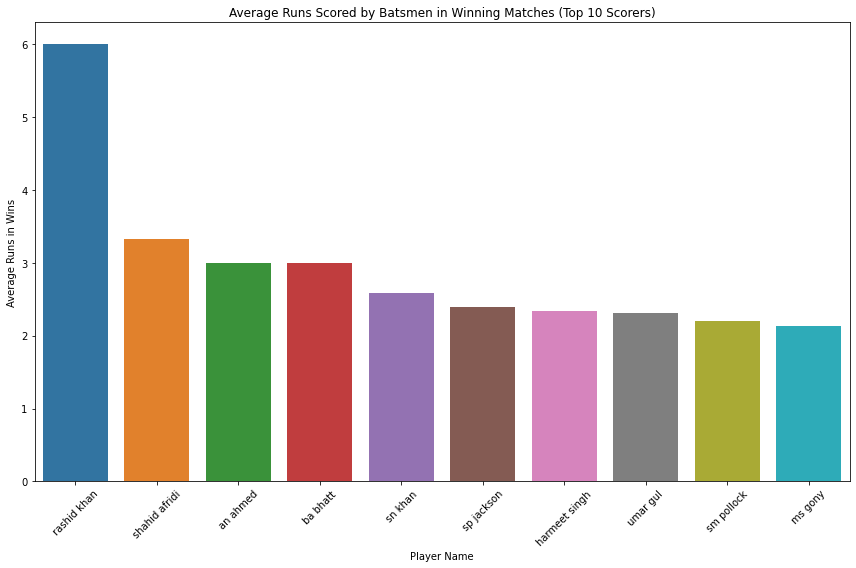

In [0]:
average_runs_pd = average_runs_in_wins.toPandas()

# Using seaborn to plot average runs in winning matches
plt.figure(figsize=(12, 8))
top_scorers = average_runs_pd.nlargest(10, 'avg_runs_in_wins')
sns.barplot(x='player_name', y='avg_runs_in_wins', data=top_scorers)
plt.title('Average Runs Scored by Batsmen in Winning Matches (Top 10 Scorers)')
plt.xlabel('Player Name')
plt.ylabel('Average Runs in Wins')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [0]:
# Execute SQL Query
scores_by_venue = spark.sql("""
SELECT venue_name, AVG(total_runs) AS average_score, MAX(total_runs) AS highest_score
FROM (
    SELECT ball_by_ball.match_id, match.venue_name, SUM(runs_scored) AS total_runs
    FROM ball_by_ball
    JOIN match ON ball_by_ball.match_id = match.match_id
    GROUP BY ball_by_ball.match_id, match.venue_name
)
GROUP BY venue_name
ORDER BY average_score DESC
""")

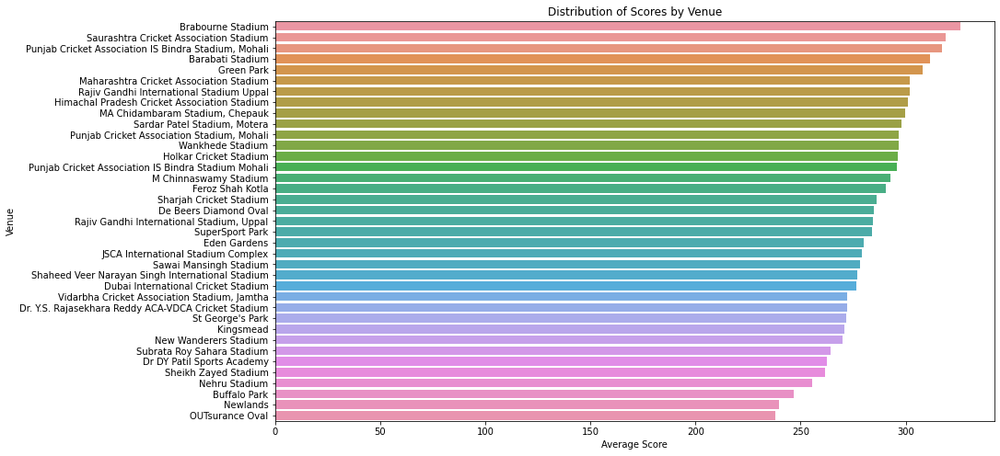

In [0]:
# Convert to Pandas DataFrame
scores_by_venue_pd = scores_by_venue.toPandas()

# Plot
plt.figure(figsize=(14, 8))
sns.barplot(x='average_score', y='venue_name', data=scores_by_venue_pd)
plt.title('Distribution of Scores by Venue')
plt.xlabel('Average Score')
plt.ylabel('Venue')
plt.show()

In [0]:
# Execute SQL Query
dismissal_types = spark.sql("""
SELECT out_type, COUNT(*) AS frequency
FROM ball_by_ball
WHERE out_type IS NOT NULL
GROUP BY out_type
ORDER BY frequency DESC
""")

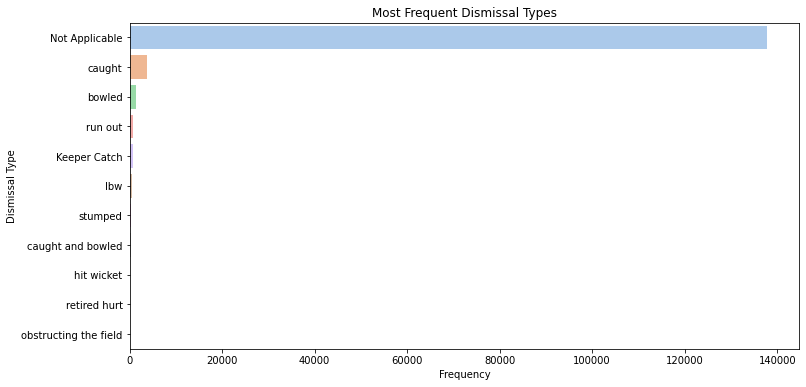

In [0]:

# Convert to Pandas DataFrame
dismissal_types_pd = dismissal_types.toPandas()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x='frequency', y='out_type', data=dismissal_types_pd, palette='pastel')
plt.title('Most Frequent Dismissal Types')
plt.xlabel('Frequency')
plt.ylabel('Dismissal Type')
plt.show()

In [0]:
# Execute SQL Query
team_toss_win_performance = spark.sql("""
SELECT team1, COUNT(*) AS matches_played, SUM(CASE WHEN toss_winner = match_winner THEN 1 ELSE 0 END) AS wins_after_toss
FROM match
WHERE toss_winner = team1
GROUP BY team1
ORDER BY wins_after_toss DESC
""")

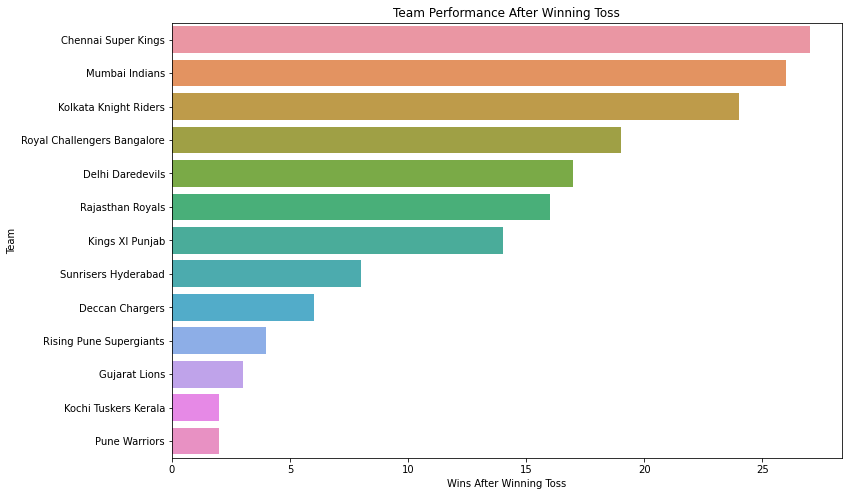

In [0]:
# Convert to Pandas DataFrame
team_toss_win_pd = team_toss_win_performance.toPandas()

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(x='wins_after_toss', y='team1', data=team_toss_win_pd)
plt.title('Team Performance After Winning Toss')
plt.xlabel('Wins After Winning Toss')
plt.ylabel('Team')
plt.show()
